# **Introduction**:
In this project, we are aiming to implement a model to predict the dastgah of a song. Dastgāh (Persian: دستگاه) is the standard musical system in Persian art music, standardized in the 19th century following the transition of Persian music from the Maqam modal system. A dastgāh consists of a collection of musical melodies, gushehs. In a song played in a given dastgah, a musician starts with an introductory gusheh, and then meanders through various gushehs, evoking different moods.

The data here is crowdsourced by the students in the Machine Learning course of the University of Theran and is available at this link.
This project is divided into 4 parts:
*   **Data Preprocessing, analysis, and visualization**: To build a robust model, 
need to clear our dataset by deleting incorrect files. Also, we need to find features that have the most correlation with our labels and help us in the classification and clustering tasks.
*   **Feature extraction**: Based on the information acquired in the first part we need to extract features and prepare our dataset for the next part.
*   **Classification**: In this part, Based on the features extracted from the model and their correlation with our classes, We need to design the best model that does the task of classifying. In this project, We try models such as Multilayer Perceptron, SVM, etc.
*   **Clustering**: Clustering music dastgah is a task of grouping music based on the similarities in their audio characteristics. We use models such as Kmeans, Agglomerative, etc.










---
# Data Preprocessing, Analysis, and Visualization

***Importin libraries***

*   **Librosa, Surfboard**: Librosa is one of the main libraries used for working with audio file. Surfboard is a library that makes exteracting features from audio easier.
*   **Pandas, Numpy, and Json**: These libraries were used in order to work with matrixes and dataframe.
*   **Matplotlib and Seanborn**: Used for showing data in graph and plots.
* **Sklearn, Tensorflow and Keras**: Specialized libraries for working with machine learning models 


## Importing libraries and loading data:

In [61]:
!pip install surfboard
#!pip install ann_visualizer
#!pip install graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 31.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.8/276.8 KB 28.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.1/317.1 KB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.2/20.2 MB 43.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 81.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 83.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 82.7 MB/s eta 0:00:00
  Created wheel for surfboard: filename=surfboard-0.2.0-py3-none-any.whl size=33226 sha256=376e2a32d4b3a27021c714b574b991b249e9cf2955b075fc602bddf31e4f1685
  Stored i

In [62]:
#importing libraries
from google.colab import drive
import pandas as pd # import pandas library
import numpy as np # import numpy library
import matplotlib.pyplot as plt # import matplotlib library
import seaborn as sns # import seaborn library
import os
import librosa
import math
import json 
import random
import librosa.display
import warnings
from IPython.display import Audio 
from IPython.core.display import display
import matplotlib.gridspec as gridspec
import sklearn
import numpy as np
#Library for Working with model 
from sklearn.feature_selection import SequentialFeatureSelector as sfs
from itertools import cycle
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from itertools import product
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn import svm
from tensorflow.keras import optimizers
from keras.utils.vis_utils import plot_model
import keras
from sklearn.model_selection import train_test_split
from tensorflow.keras import Sequential
from tensorflow.keras.layers import *
from sklearn import preprocessing
from surfboard.sound import Waveform
from surfboard.feature_extraction import extract_features
from sklearn.model_selection import train_test_split
hop_length = 512
n_fft = 2048
warnings.filterwarnings('ignore')
Dastagh_names=['Shour', 'Segah','Mahoor','Homayoun','Rast Panjgah','Nava','Chargah']
Instrument_names=['Tar','Kamanche','Santoor','Setar','Ney','Combinative']
DURATION = 20
SAMPLE_RATE = 22050
SAMPLES_PER_TRACK = SAMPLE_RATE * DURATION

In [ ]:
#mounting Google drive 
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#loading data from our google drive
!cp -r /content/drive/MyDrive/MLDATA  /content

In [ ]:
cd MLDATA

/content/MLDATA


## Data Visualization
Showing random samples of data in each classs

Reza_Varzande-Homayoun-Taknavazi_Santoor15-[AudioTrimmer.com] in Homayoun played with Santoor


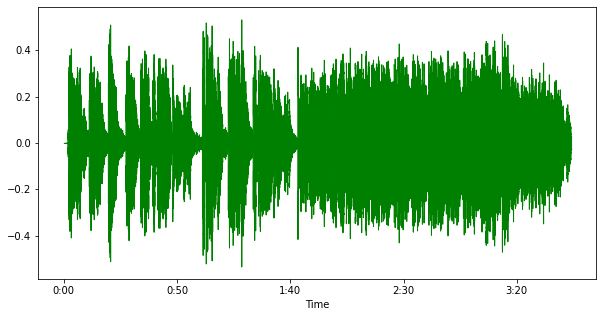

♫♫ دانلود آهنگ ساز دل از پرویز یاحقی ♫♫ in Homayoun played with Kamanche


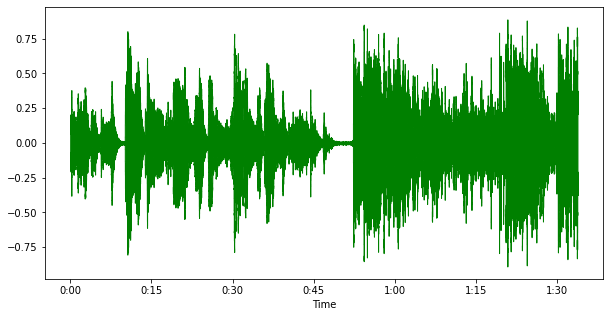

Farhang_sharif in Homayoun played with Tar


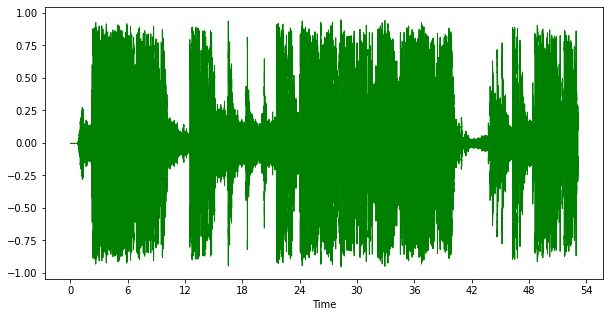

setar-Homayoon in Homayoun played with Setar


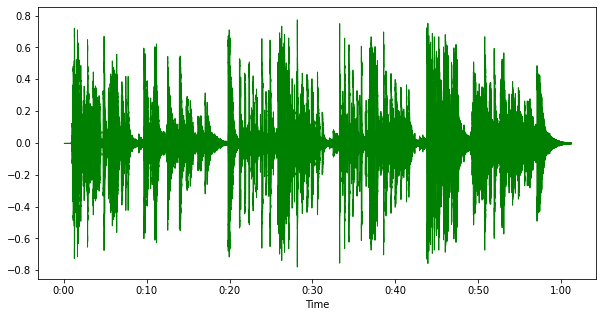

hamed_amjadian_3_4_59S in Homayoun played with Ney


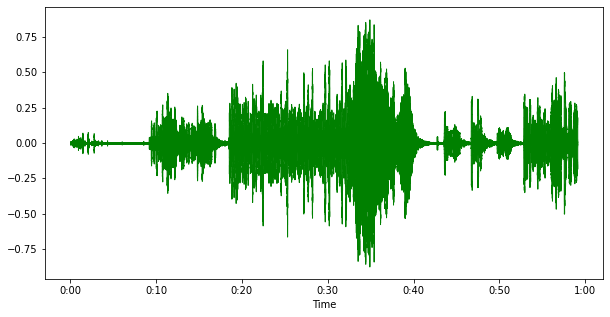

Golpayegani(0-30) in Homayoun played with Combinative


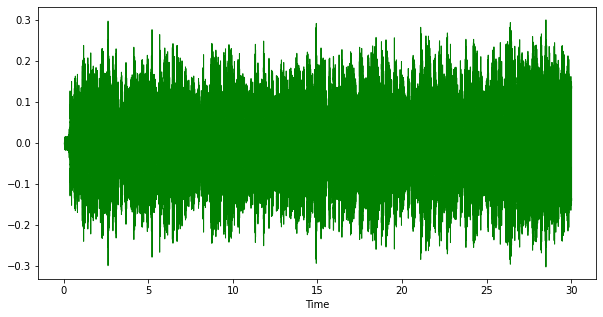

Y2Mate.is - نی نوازی در دستگاه  چهارگاه از حامد امجدیان-pV9tfx5cQcU-160k-1658233540460 in Chargah played with Ney


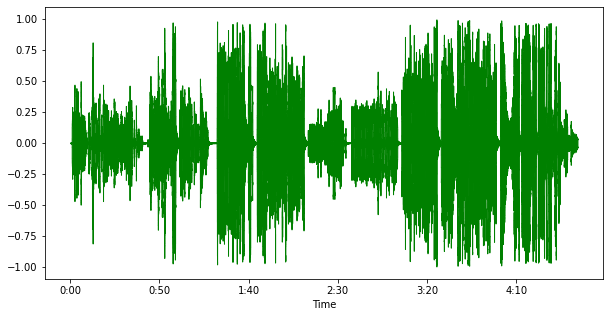

jahannamayi_hesssar in Chargah played with Tar


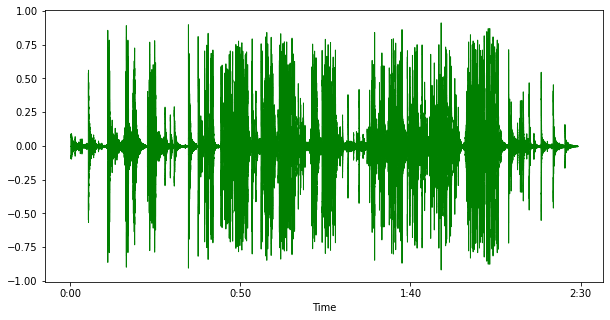

آنکه دلم in Chargah played with Santoor


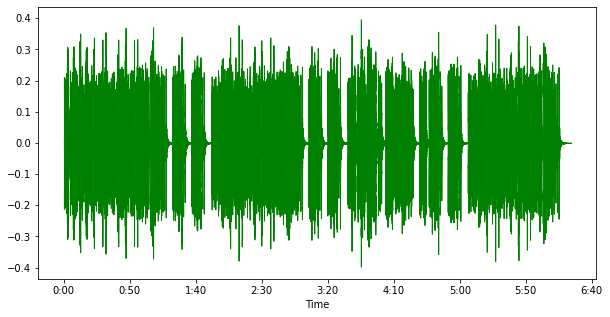

اسماعیل زاده (چهارگاه) in Chargah played with Kamanche


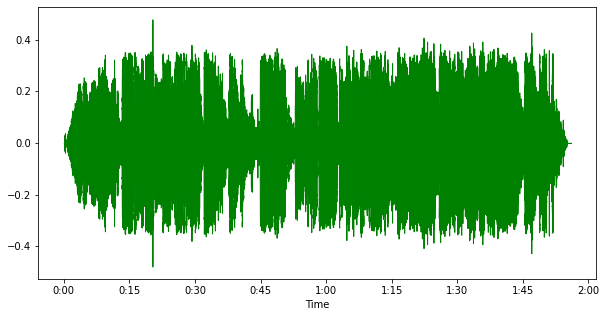

Mogozaram(AlirezaEftekhari) in Chargah played with Combinative


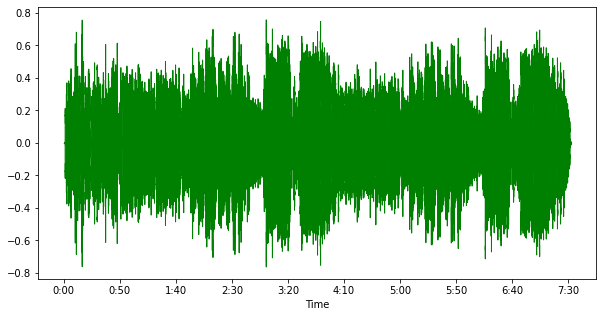

03-4Mezrab_4Gah in Chargah played with Setar


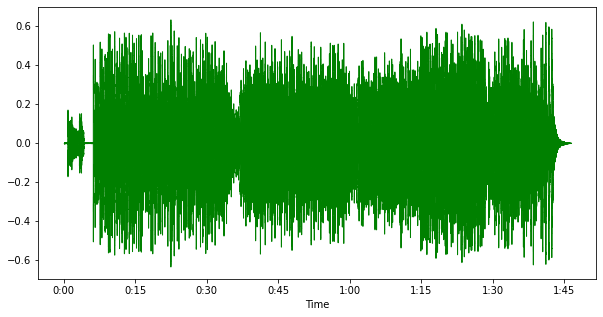

Gole-Gandom (1) in Shour played with Combinative


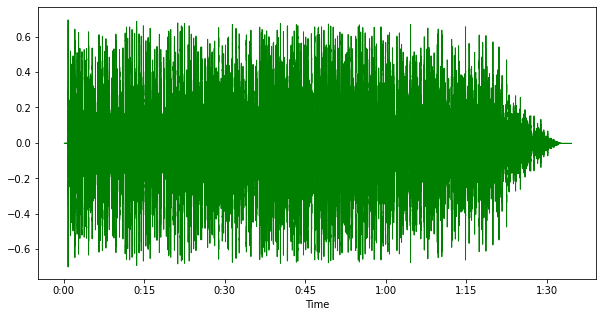

00 in Shour played with Tar


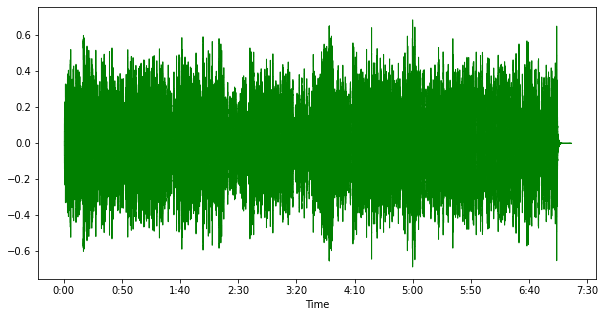

Salar-Aghili-Taknavazi-Setar-(Bayat-Turk-Shour)-@Otaghe8Bot in Shour played with Setar


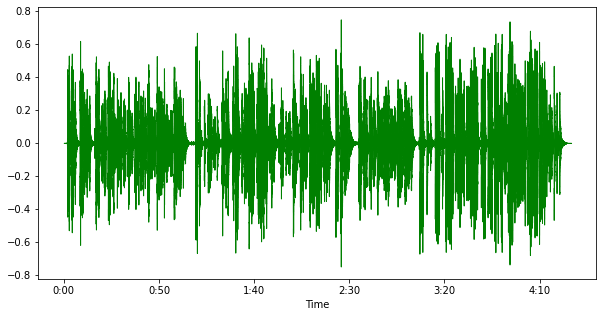

Shur in Shour played with Santoor


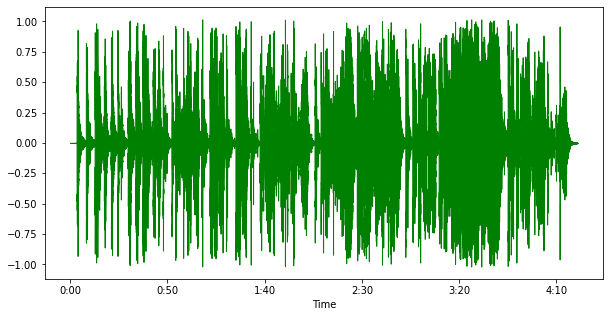

04 in Shour played with Ney


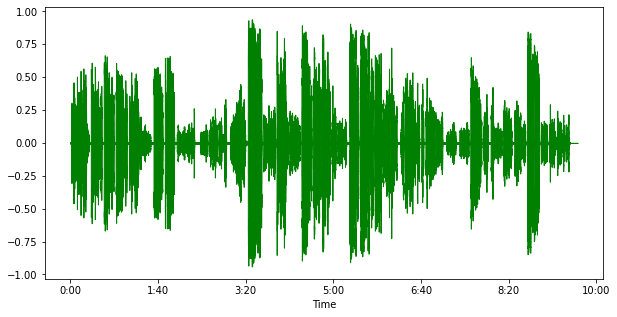

dashtimoosa in Shour played with Kamanche


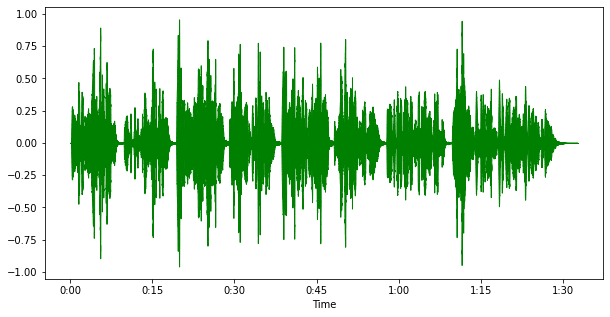

Arash_Samimi_nei_Mahoor in Mahoor played with Ney


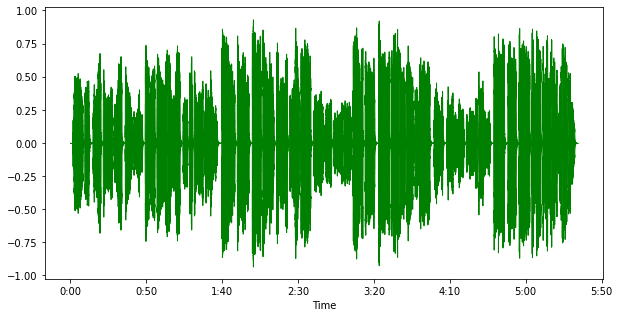

Hossein_Alizadeh-Fili in Mahoor played with Tar


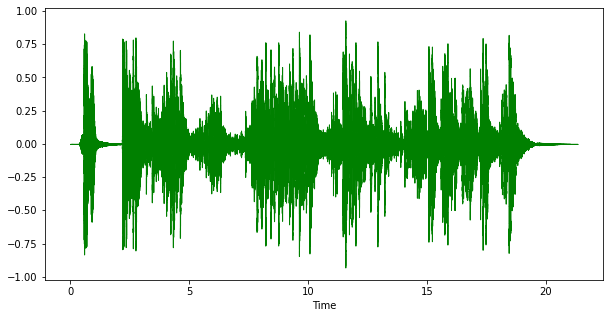

SomayeBH4_ضربی_ماهور_سه_تار_و_نی_پرویز_مشکاتیان_محمد_مو in Mahoor played with Combinative


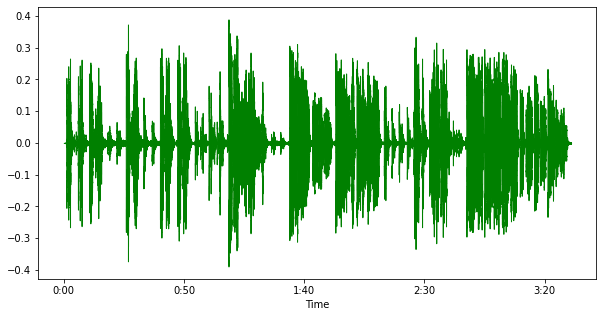

hossein_khavas_santoor_mahoor in Mahoor played with Santoor


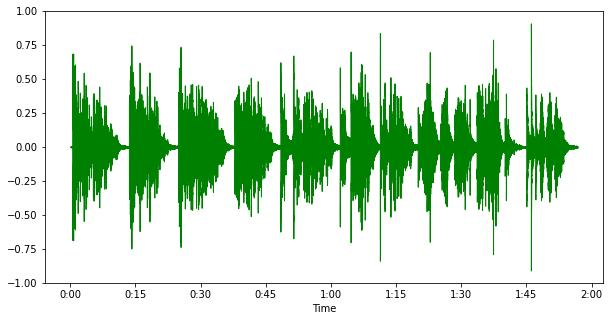

Kambiz Ghafouri - رنگ ماهور درویش خان in Mahoor played with Setar


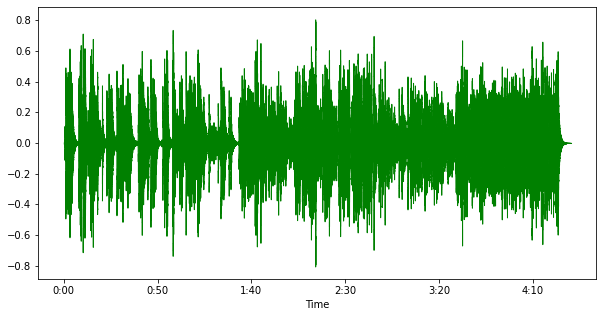

کمانچه ماهور  مازیار شریفیان in Mahoor played with Kamanche


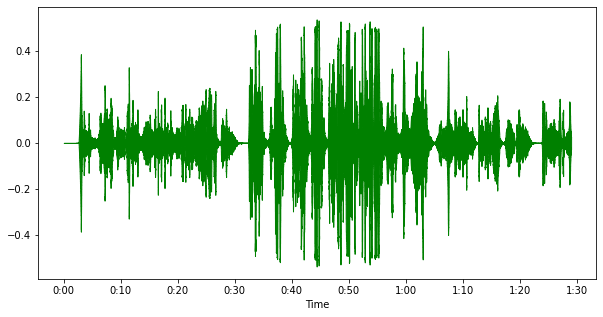

Ashiran-Roohafza in Nava played with Tar


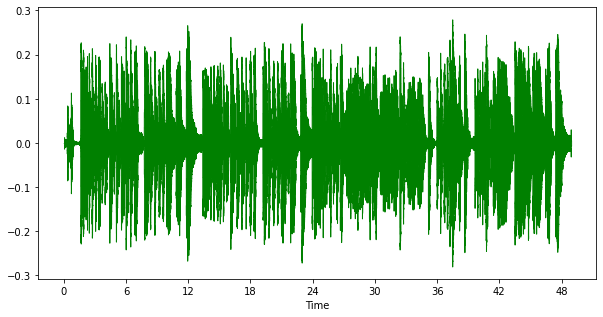

pishdaramadnava in Nava played with Kamanche


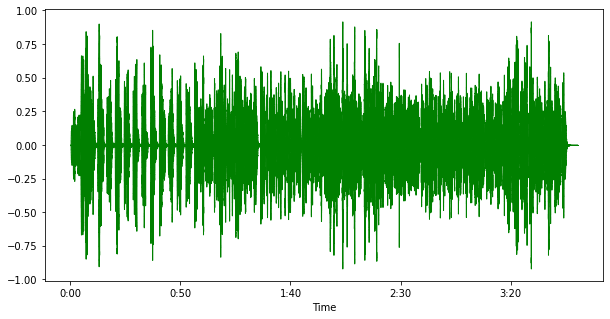

♫♫ دانلود آهنگ قافله سالار از محمدرضا لطفی ♫♫ in Nava played with Setar


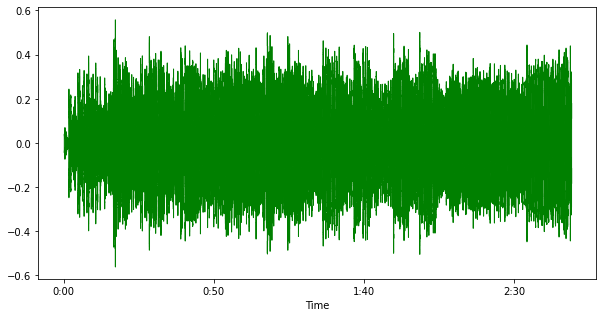

ShahristPorZarifan(Eftekhari) in Nava played with Combinative


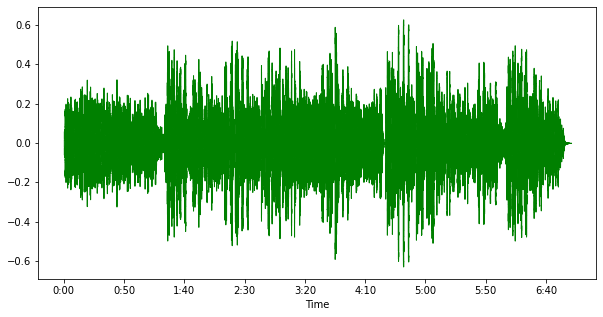

Farshid in Nava played with Santoor


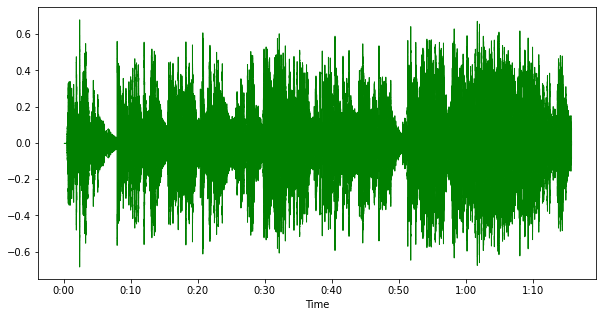

54 in Nava played with Ney


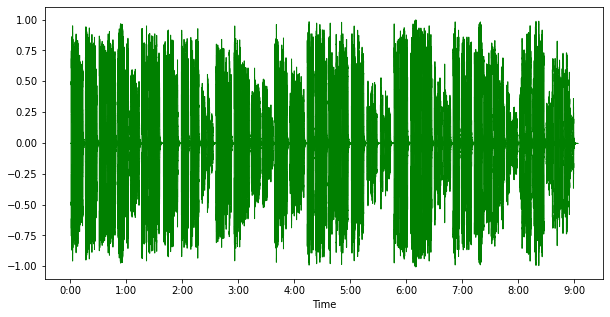

Amjad in Segah played with Ney


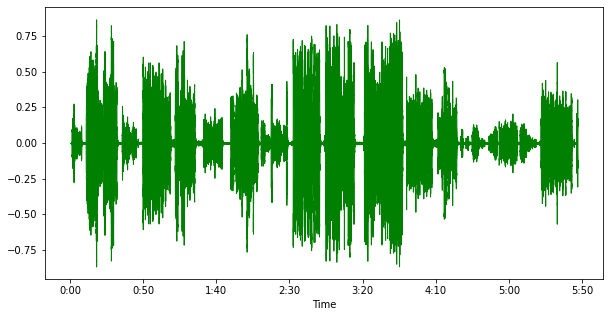

Lotfi(954-984) in Segah played with Tar


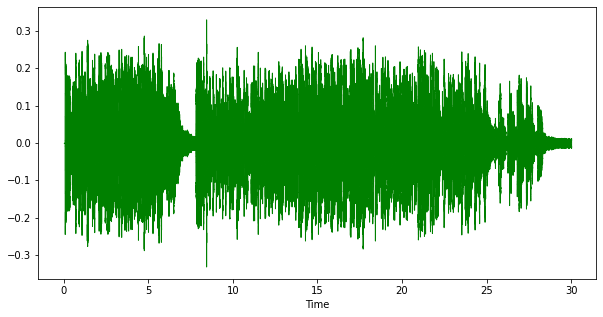

SaazeDel_Parviz_Yahaghi-Dastgah_Segah in Segah played with Kamanche


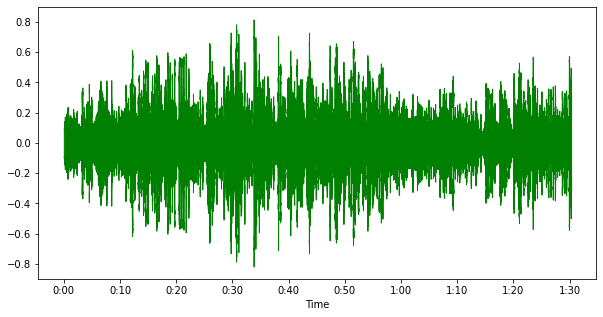

Faramarz_Payvar-Segah-SONG95IR in Segah played with Santoor


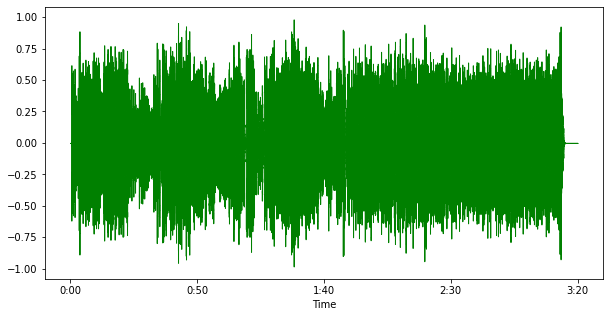

mix-Segah-pirniakan-MohammadReza Shajarian - Asemane Eshgh_1 in Segah played with Combinative


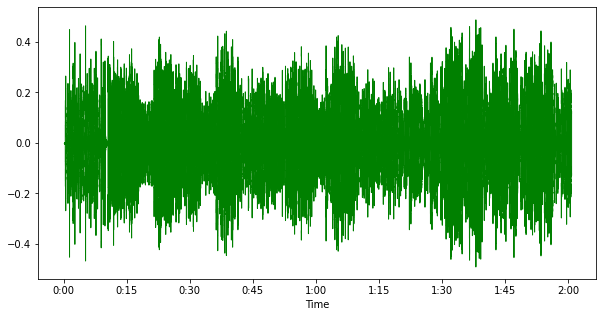

سه تار سه گاه احمد عبادی 4 in Segah played with Setar


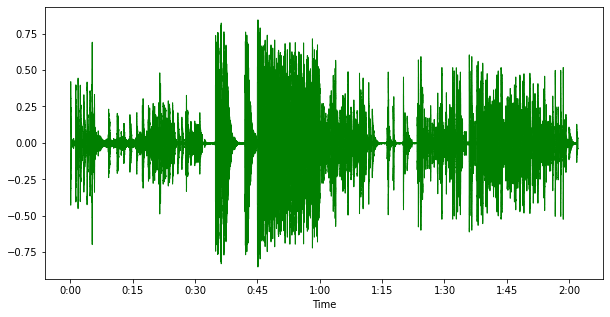

Farmarz in Rast Panjgah played with Santoor


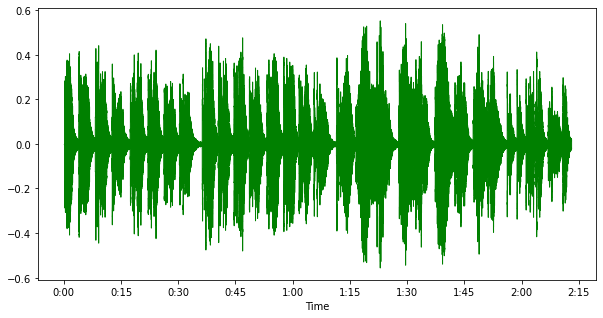

سه تار احمد عبادی راست پنجگاه 3 in Rast Panjgah played with Setar


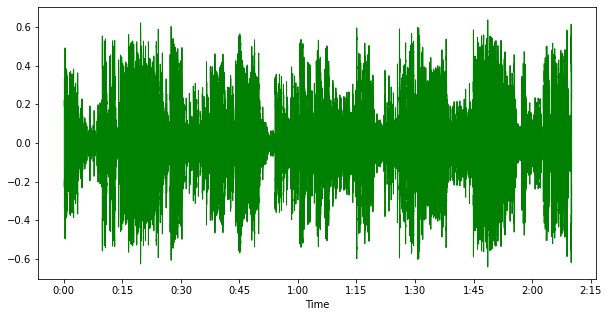

Y2Mate.is - Kashti Shekastegan-THcsNeCINbQ-160k-1658234254528_[cut_249sec] in Rast Panjgah played with Combinative


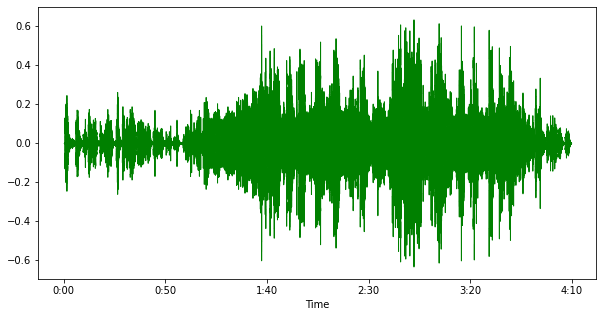

نوروز صبا in Rast Panjgah played with Tar


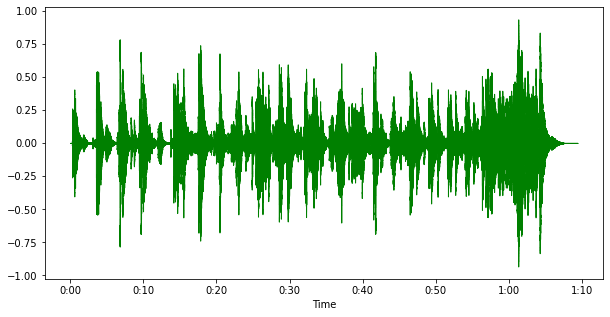

44 in Rast Panjgah played with Ney


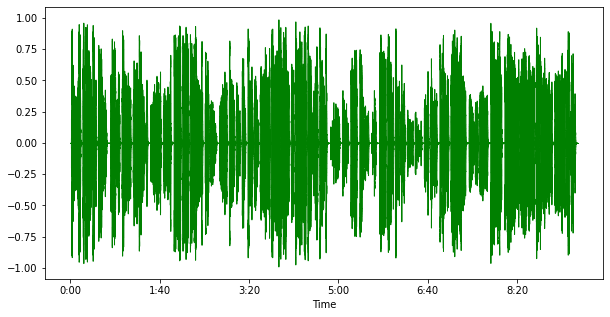

Mohammad_Reza_Lotfi-Taknavazi_Taar_Dar_Dastgah_Rast_Panjgah-(WWW (mp3cut.net) (2) in Rast Panjgah played with Kamanche


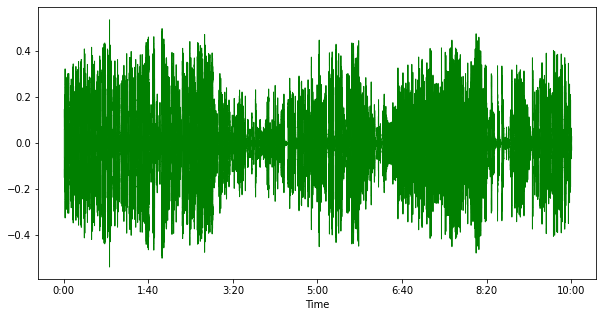

In [ ]:

Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  Instruments = [f for f in os.listdir(Dastgah)]
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      print(song[:-4]+ " in "+ Dastagh_names[int(Dastgah[2])] + " played with "+ Instrument_names[int(instrument[2])])
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      plt.figure(figsize=(10,5))
      librosa.display.waveshow(signal, color = "Green")
      plt.show()
      #display(Audio(Dastgah+"/"+instrument+'/'+song, autoplay=False))
    except:
      pass

## **Audio features**

We use two sets of feautres for this project, the first set are as followed:
*   Zero Crossing Rate: The rate at which the signal changes from positive to negative or back.
*   STFT (Short Time Fourier Transforms): The STFT represents a signal in the time-frequency domain by computing discrete Fourier transforms (DFT) over short overlapping windows
*   Harmonics and Perceptrual: Harmonics are characteristichs that human years can't distinguish (represents the sound color). Perceptrual understanding shock wave represents the sound rhythm and emotion
*   Tempo BMP (beats per minute): Dynamic programming beat tracker.
*   Spectral Centroid: Indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound.
*   Spectral Rolloff: It is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies
*   Spectral Bandwidth: Spectral Bandwidth is the spectral range of interest around the centroid, that is, the variance from the spectral centroid.
*   Mel-Frequency Cepstral Coefficients: The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.
*   Chroma Frequencies: Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.

The second sets of features are:




### **Zero Crossing Rate**

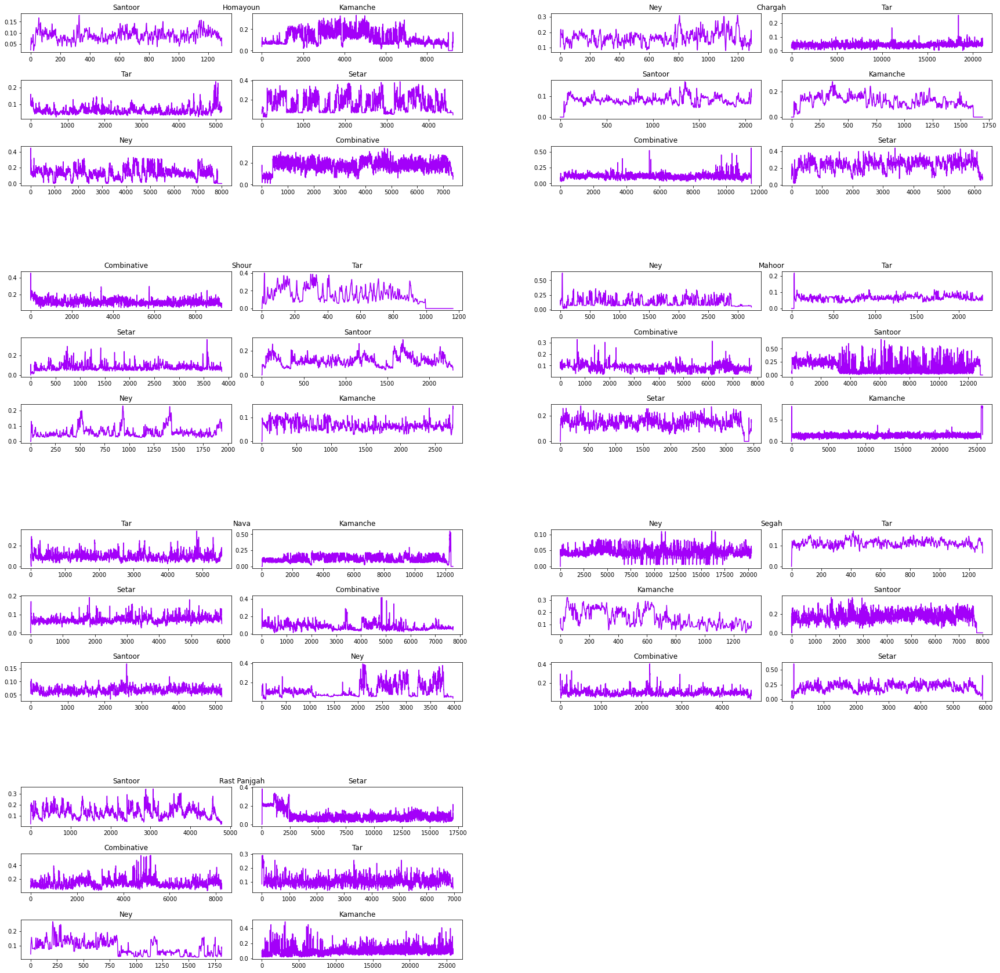

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      zero_crossing_rate = librosa.feature.zero_crossing_rate(y = signal,hop_length = hop_length)[0]
      ax = plt.Subplot(fig, inner[j])
      ax.title.set_text(Instrument_names[int(instrument[2])])
      ax.plot(zero_crossing_rate,color = "#A300F9")
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()

### **STFT (Short Time Fourier Transforms)**

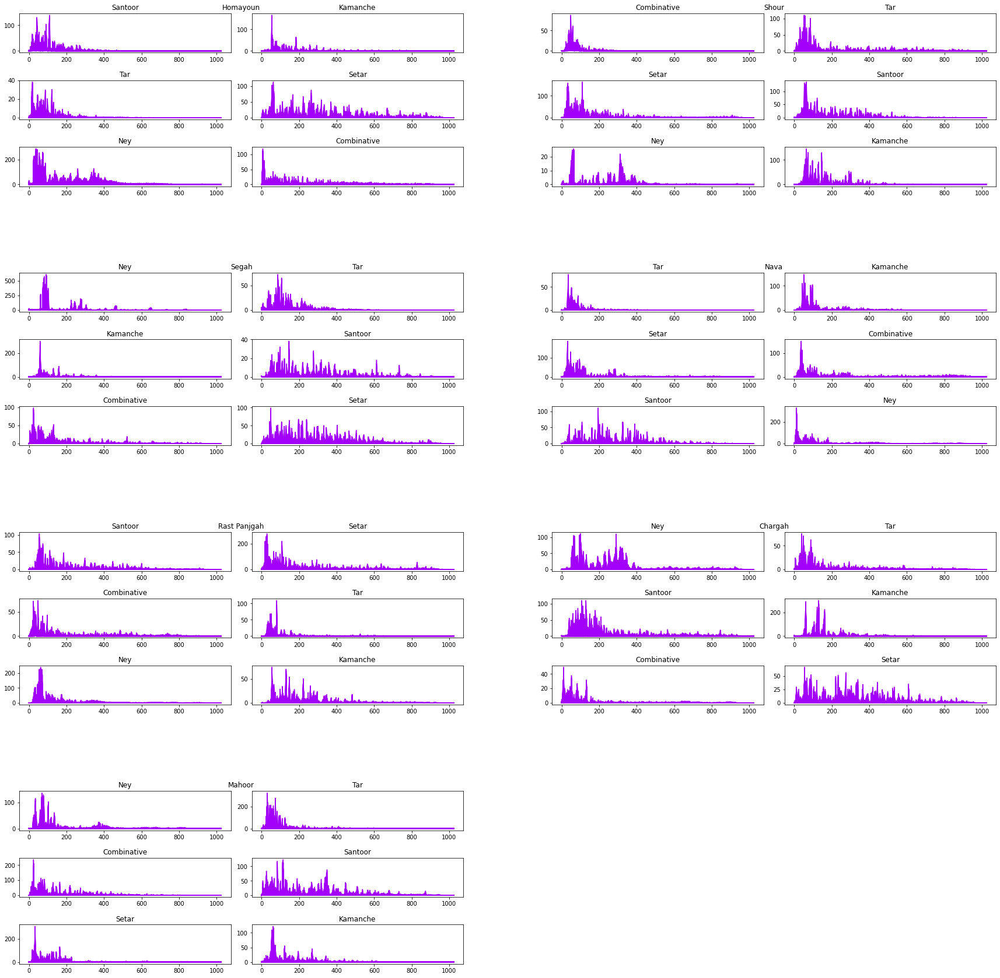

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      ax = plt.Subplot(fig, inner[j])
      # Reading a random audio file
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      start_sample = 0
      finish_sample = start_sample + SAMPLES_PER_TRACK 
      stft_data = np.abs(librosa.stft(y = signal[start_sample:finish_sample], n_fft = n_fft,hop_length = hop_length))
      ax.plot(stft_data,color = "#A300F9")
      ax.title.set_text(Instrument_names[int(instrument[2])])
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()

### **Harmonics and Perceptrual**

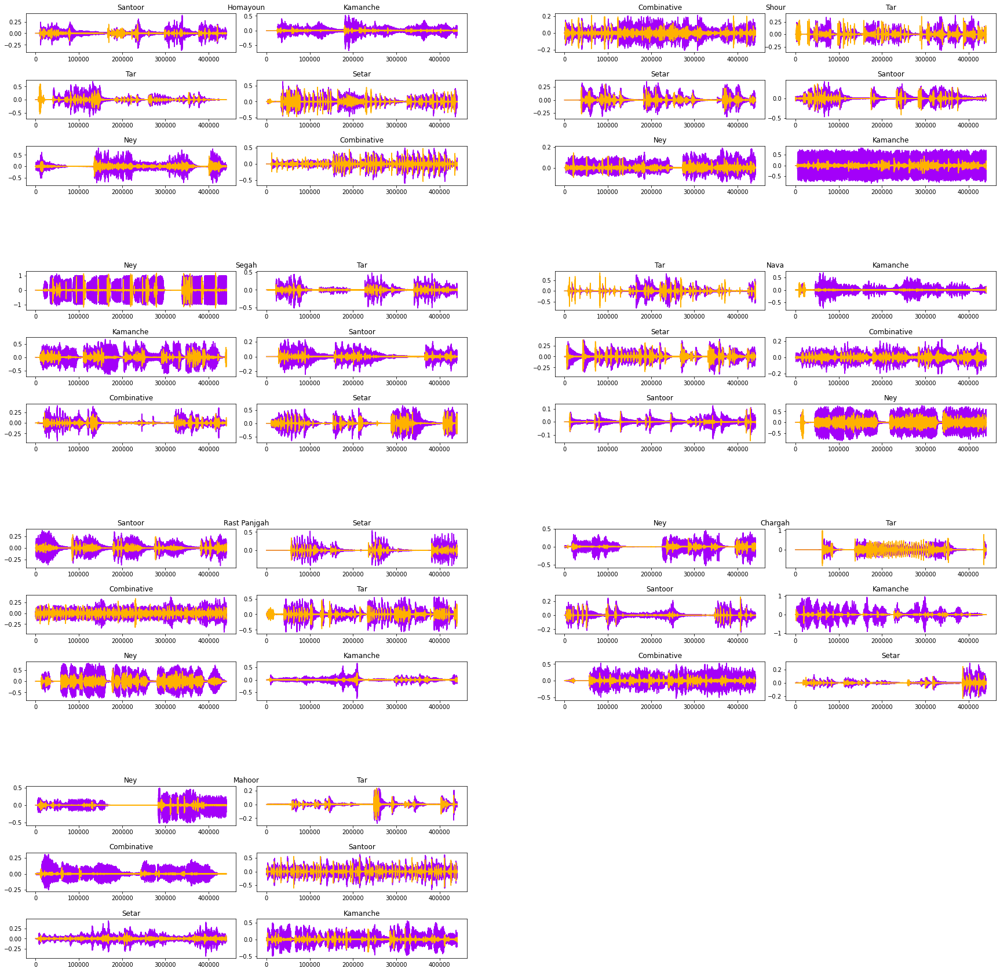

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      ax = plt.Subplot(fig, inner[j])
      # Reading a random audio file
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      start_sample = 0
      finish_sample = start_sample + SAMPLES_PER_TRACK 
      y_harm, y_perc = librosa.effects.hpss(signal[start_sample:finish_sample])
      ax.plot(y_harm, color = '#A300F9')
      ax.plot(y_perc, color = '#FFB100')
      ax.title.set_text(Instrument_names[int(instrument[2])])
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()


### **Tempo BMP (beats per minute)**

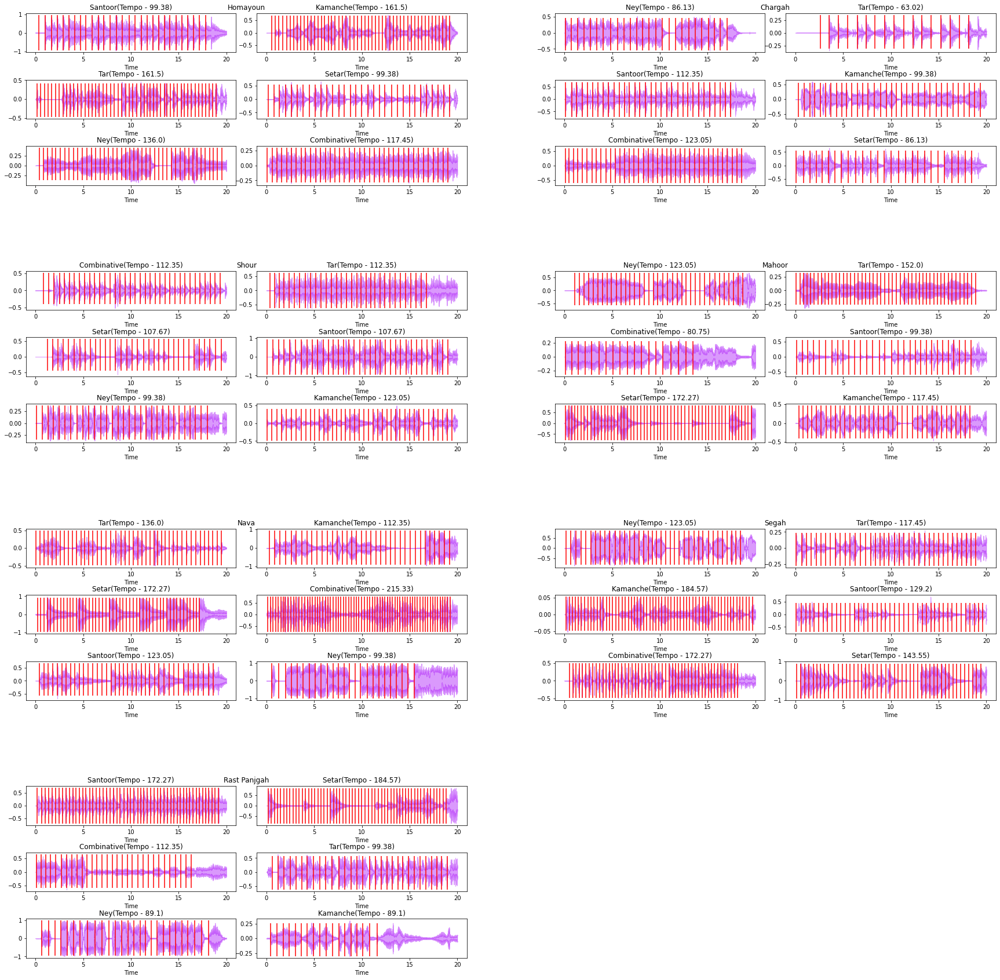

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      start_sample = 0
      finish_sample = start_sample + SAMPLES_PER_TRACK 
      tempo, beat_times = librosa.beat.beat_track(y=signal[start_sample:finish_sample], sr=sr, units='time')
      ax = plt.Subplot(fig, inner[j])
      ax.title.set_text(Instrument_names[int(instrument[2])]+"(Tempo - " + str(round(tempo,2)) + ")")
      librosa.display.waveshow(y = signal[start_sample:finish_sample], sr = sr, color = "#A300F9",alpha = 0.4,ax=ax)
      ax.vlines(beat_times, np.min(signal[start_sample:finish_sample]), np.max(signal[start_sample:finish_sample]), color='r')
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()

### **Spectral Centroid**

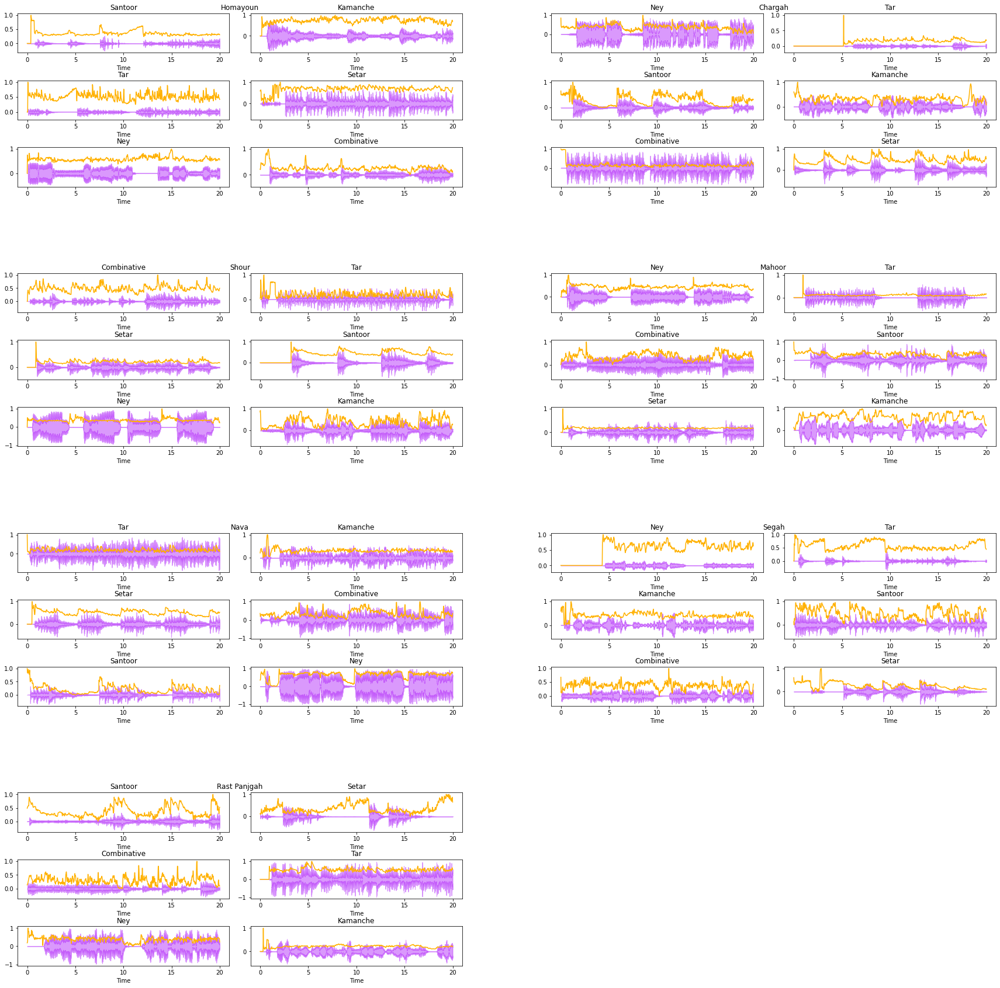

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      start_sample = 0
      finish_sample = start_sample + SAMPLES_PER_TRACK 
      spectral_centroids = librosa.feature.spectral_centroid(y=signal[start_sample:finish_sample], sr=sr)[0]
    
      # Computing the time variable for visualization
      frames = range(len(spectral_centroids))

      # Converts frame counts to time (seconds)
      t = librosa.frames_to_time(frames)
      ax = plt.Subplot(fig, inner[j])
      ax.title.set_text(Instrument_names[int(instrument[2])])
      librosa.display.waveshow(signal[start_sample:finish_sample], sr=sr, alpha=0.4, color = '#A300F9',ax=ax)
      ax.plot(t, sklearn.preprocessing.minmax_scale(spectral_centroids, axis=0), color='#FFB100')
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()

### **Spectral Rolloff**



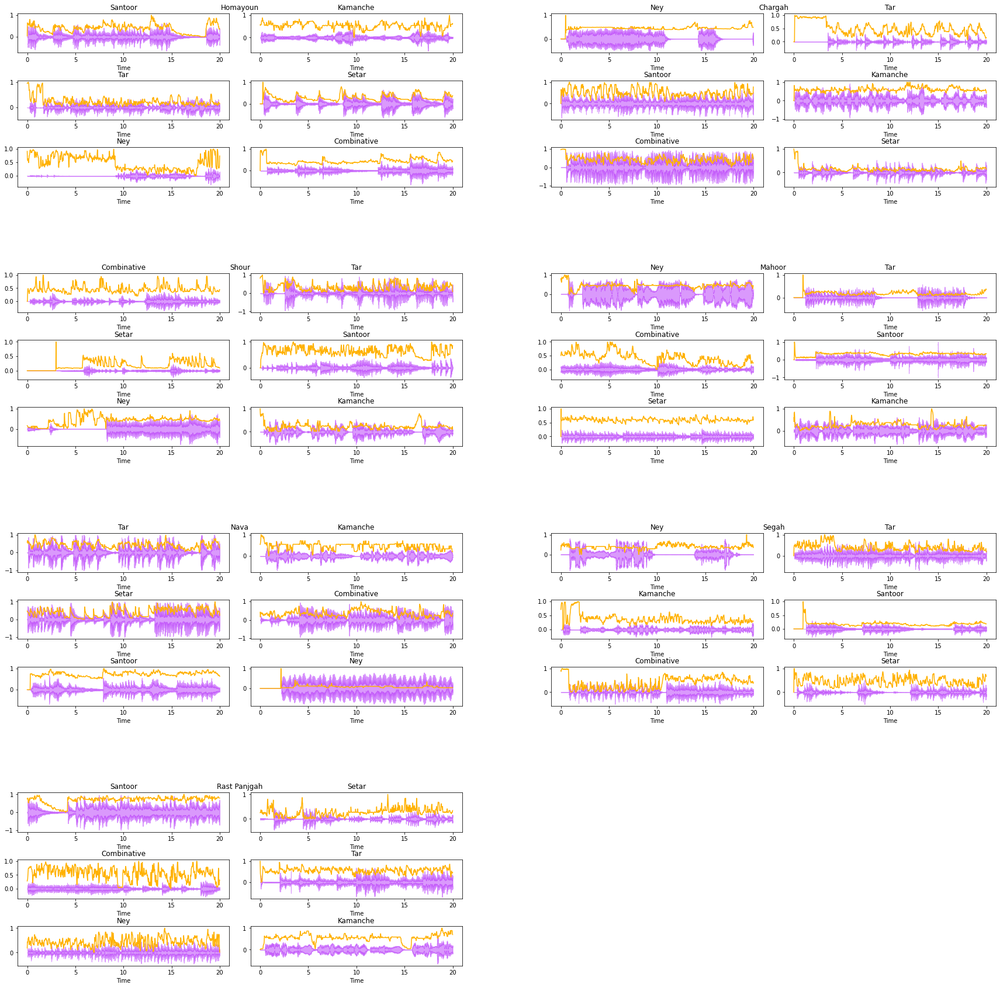

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      ax = plt.Subplot(fig, inner[j])
      # Reading a random audio file
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      start_sample = 0
      finish_sample = start_sample + SAMPLES_PER_TRACK 
      spectral_rolloff = librosa.feature.spectral_rolloff(signal[start_sample:finish_sample], sr=sr)[0]
      # Computing the time variable for visualization
      frames = range(len(spectral_rolloff))

      # Converts frame counts to time (seconds)
      t = librosa.frames_to_time(frames)
      librosa.display.waveshow(signal[start_sample:finish_sample], sr=sr, alpha=0.4, color = '#A300F9',ax=ax)
      ax.plot(t, sklearn.preprocessing.minmax_scale(spectral_rolloff, axis=0), color='#FFB100')
      ax.title.set_text(Instrument_names[int(instrument[2])])
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()

### **Spectral Bandwidth**

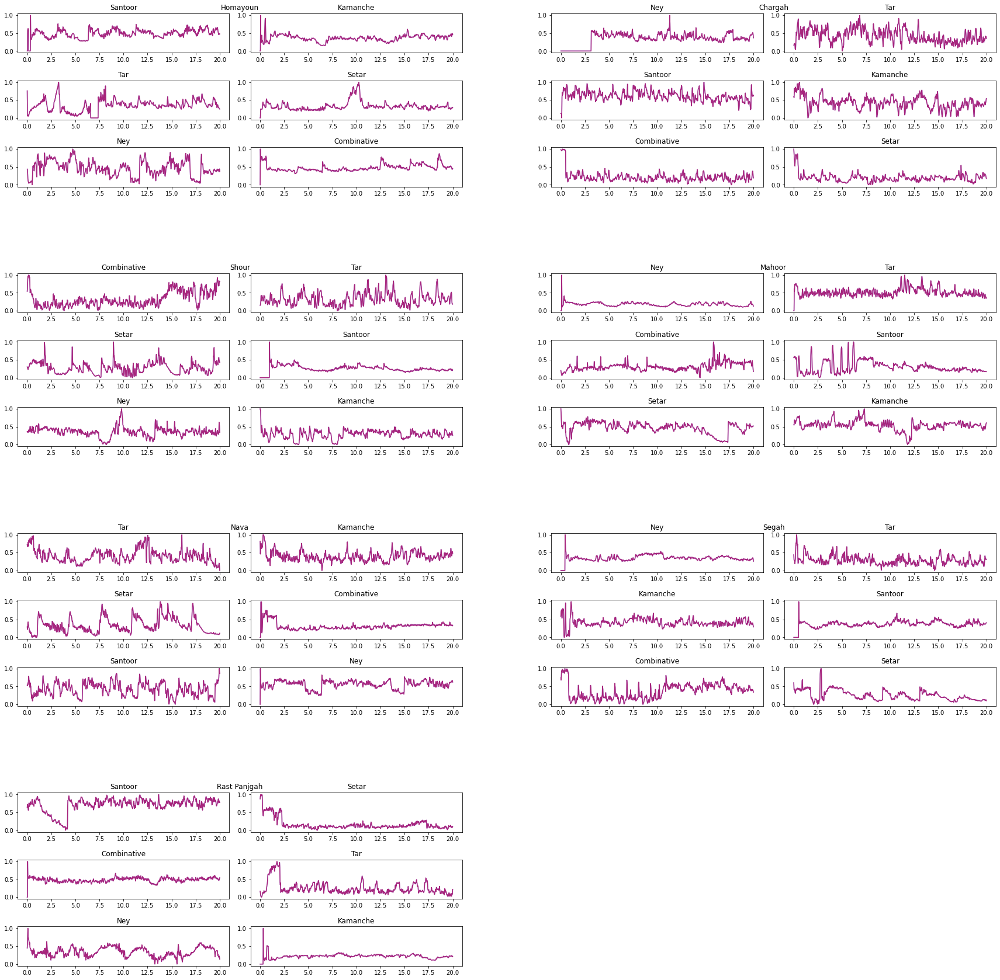

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      ax = plt.Subplot(fig, inner[j])
      # Reading a random audio file
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      start_sample = 0
      finish_sample = start_sample + SAMPLES_PER_TRACK 
      spectral_centroids = librosa.feature.spectral_centroid(signal[start_sample:finish_sample], sr=sr)[0]
      spec_bw = librosa.feature.spectral_bandwidth(signal[start_sample:finish_sample], sr=sr)[0]
      # Computing the time variable for visualization
      frames = range(len(spectral_centroids))

      # Converts frame counts to time (seconds)
      t = librosa.frames_to_time(frames)

      ax.plot(t, sklearn.preprocessing.minmax_scale(spectral_centroids, axis=0), color='b',alpha = 0.7)
    
      ax.plot(t, sklearn.preprocessing.minmax_scale(spectral_centroids + np.sqrt(spec_bw), axis=0), color='r',alpha = 0.3)
      
      ax.plot(t, sklearn.preprocessing.minmax_scale(spectral_centroids - np.sqrt(spec_bw), axis=0), color='r',alpha = 0.3)
      ax.title.set_text(Instrument_names[int(instrument[2])])
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()

### **Mel-Frequency Cepstral Coefficients:**

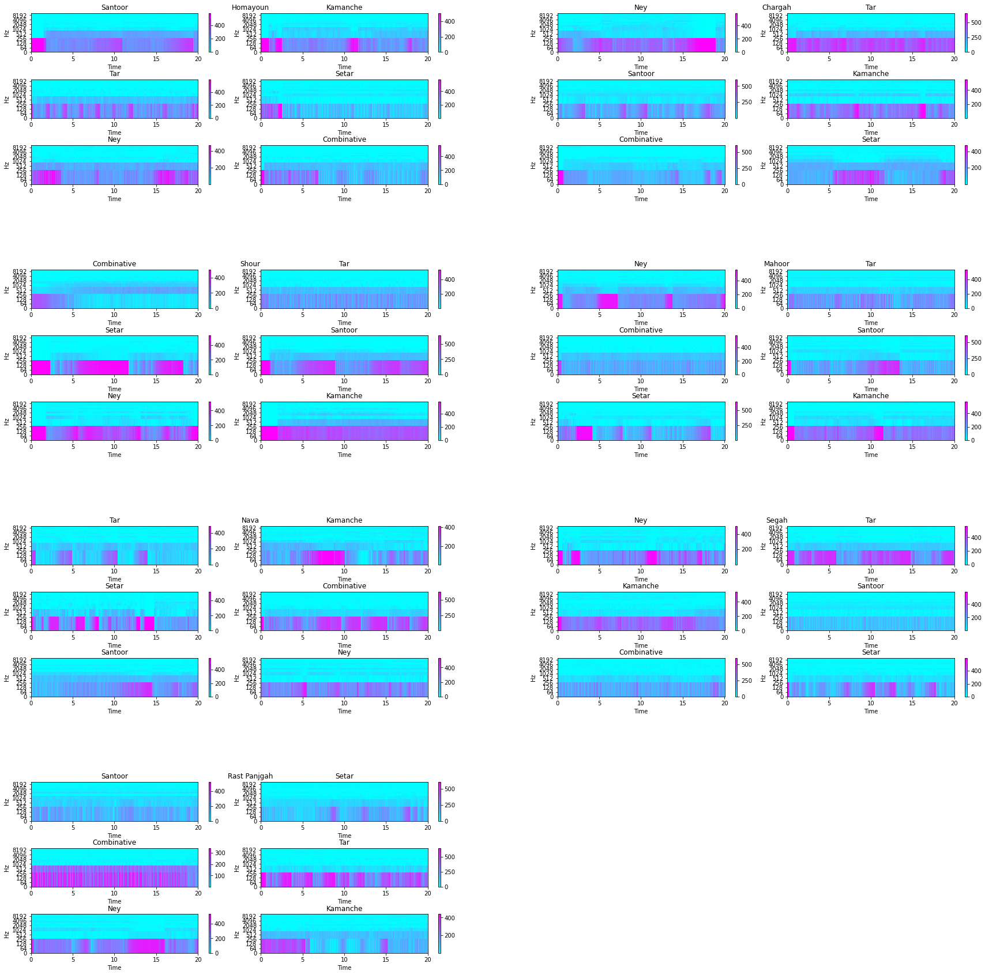

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      ax = plt.Subplot(fig, inner[j])
      # Reading a random audio file
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      start_sample = 0
      finish_sample = start_sample + SAMPLES_PER_TRACK 
      mfcc_data = np.abs(librosa.feature.mfcc(signal[start_sample:finish_sample], sr=sr))
    
      img = librosa.display.specshow(mfcc_data, sr = sr, x_axis = 'time', y_axis = 'log',cmap = 'cool',ax=ax)
      fig.colorbar(img, ax=ax)
      ax.title.set_text(Instrument_names[int(instrument[2])])
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()

### **Mel Spectogram**

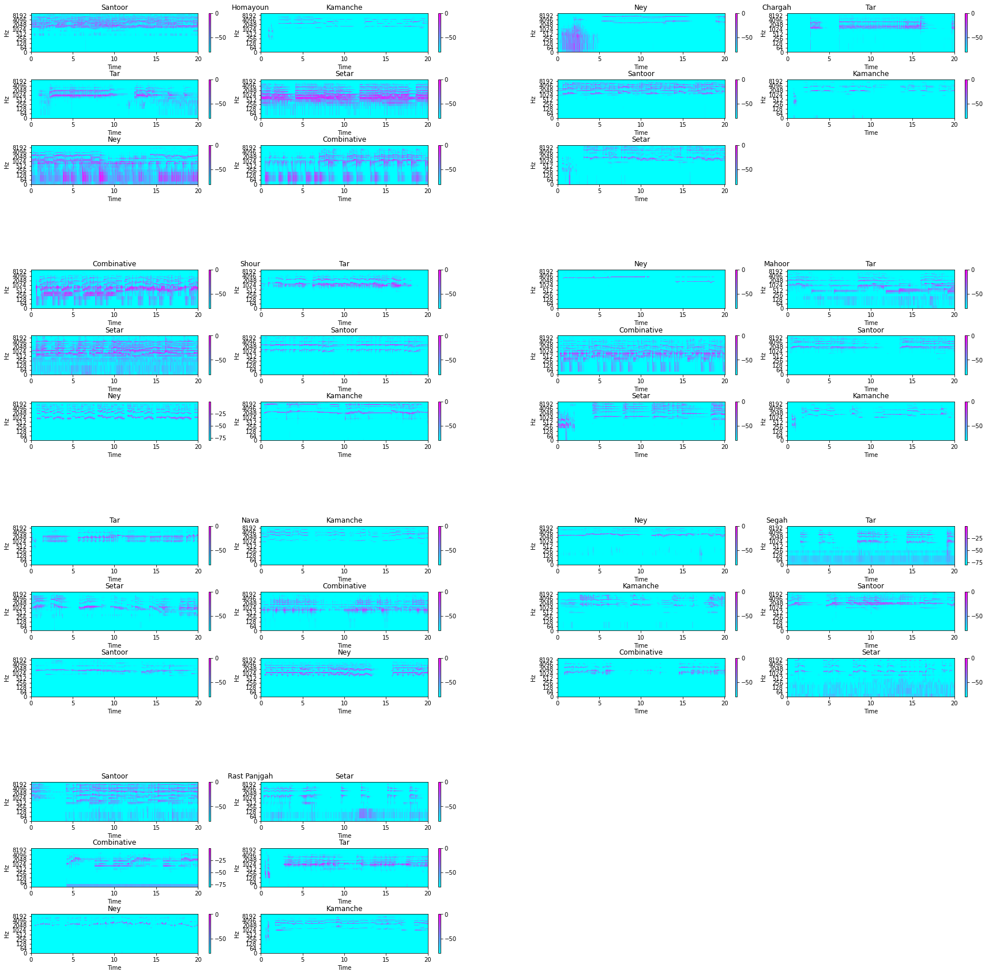

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      ax = plt.Subplot(fig, inner[j])
      # Reading a random audio file
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      start_sample = 0
      finish_sample = start_sample + SAMPLES_PER_TRACK 
      mel_spec = librosa.feature.melspectrogram(signal[start_sample:finish_sample], sr=sr,hop_length = hop_length)
      mel_spec_db = librosa.amplitude_to_db(mel_spec, ref=np.max)
    
      img = librosa.display.specshow(mel_spec_db, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',cmap = 'cool',ax=ax)
      fig.colorbar(img, ax=ax)
      ax.title.set_text(Instrument_names[int(instrument[2])])
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()

### **Spectogram**

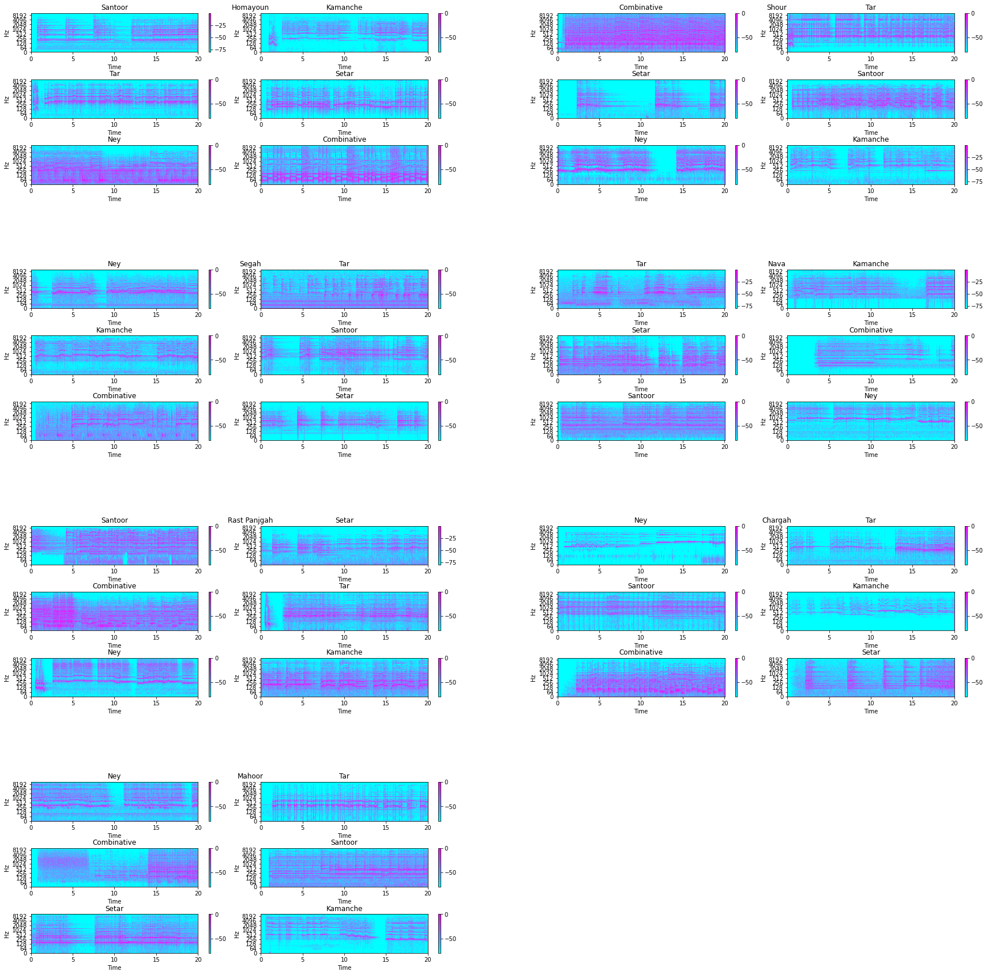

In [ ]:
i = 0
j = 0
fig = plt.figure(figsize=(30, 30))
#subplots = fig.subfigures(3,2)
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.5)
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  j=0
  Instruments = [f for f in os.listdir(Dastgah)]
  inner = gridspec.GridSpecFromSubplotSpec(3, 2,
                  subplot_spec=outer[i], wspace=0.1, hspace=0.7)
  ax = plt.Subplot(fig, outer[i])
  ax.set_title(Dastagh_names[int(Dastgah[2])])
  ax.axis('off')
  fig.add_subplot(ax)
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    try:
      song=random.choice(songs)
      while(song[-4:]!=".mp3"):
        song=random.choice(songs)
      ax = plt.Subplot(fig, inner[j])
      # Reading a random audio file
      signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song,sr=22050)
      start_sample = 0
      finish_sample = start_sample + SAMPLES_PER_TRACK 
      stft_data = np.abs(librosa.stft(y = signal[start_sample:finish_sample], n_fft = n_fft,hop_length = hop_length))
    
      # Convert an amplitude spectrogram to Decibels-scaled spectrogram.
      DB = librosa.amplitude_to_db(stft_data, ref = np.max)

      img = librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',cmap = 'cool',ax=ax)
      fig.colorbar(img, ax=ax)
      ax.title.set_text(Instrument_names[int(instrument[2])])
      j=j+1
      fig.add_subplot(ax)
    except:
      pass
  i=i+1
plt.show()



---
# Feautre Exteraction
Now we need to exteract. We have two methods of extercating these features:


*   Librosa: The main library for sound feature exteraction.
*   Surfboard: This library is implemented based on Librosa and it just makes working with data easier.


## Surfboard

In [ ]:
labels=[]
mfcc=[]
log_melspec=[]
rms=[]
chroma_stft=[]
zerocrossing=[]
ppe=[]
magnitude_spectrum=[]
shannon_entropy_slidingwindow=[]
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  Instruments = [f for f in os.listdir(Dastgah)]
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    for song in songs:
      if(song[-4:]==".mp3" or song[-4:]==".wav"):
        sound = Waveform(path=Dastgah+"/"+instrument+'/'+song)
        mfcc.append(extract_features([sound],
                                              ['mfcc'],
                                              ['mean', 'std', 'skewness',
                                               'kurtosis']))
        log_melspec.append(extract_features([sound],
                                              ['log_melspec'],
                                              ['mean', 'std', 'skewness',
                                               'kurtosis']))
        rms.append(extract_features([sound], ['rms'],
                                               ['mean', 'std']))
        chroma_stft.append(extract_features([sound], ['chroma_stft'],
                                               ['mean', 'std']))
        zerocrossing.append(extract_features([sound], ['zerocrossing'],
                                               ['mean', 'std']))
        ppe.append(extract_features([sound], ['ppe'],
                                               ['mean', 'std']))
        magnitude_spectrum.append(extract_features([sound], ['magnitude_spectrum'],
                                              ['mean', 'std', 'skewness']))
        shannon_entropy_slidingwindow.append(extract_features([sound], ['shannon_entropy_slidingwindow'],
                                      ['mean', 'std', 'skewness']))
        labels.append([int(Dastgah[2]),int(instrument[2])])

Streaming output truncated to the last 5000 lines.
Extracting features...: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]
/usr/local/lib/python3.8/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
Extracting features...: 100%|██████████| 1/1 [00:00<00:00, 13.39it/s]
/usr/local/lib/python3.8/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
Extracting features...: 100%|██████████| 1/1 [00:00<00:00,  9.58it/s]
/usr/local/lib/python3.8/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
Extracting features...: 100%|██████████| 1/1 [00:00<00:00,  7.15it/s]
/usr/local/lib/python3.8/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. 

In [ ]:
#main1 = pd.concat(labels)
main2 = pd.concat(mfcc)
main3 = pd.concat(log_melspec)
main4 = pd.concat(rms)
main5 = pd.concat(chroma_stft)
main6 = pd.concat(zerocrossing)
main7 = pd.concat(ppe)
main8 = pd.concat(magnitude_spectrum)
main9 = pd.concat(shannon_entropy_slidingwindow)
#main1.to_csv("labels.csv")
main2.to_csv("mfcc.csv")
main3.to_csv("log_melspec.csv")
main4.to_csv("rms.csv")
main5.to_csv("chroma_stft.csv")
main6.to_csv("zerocrossing.csv")
main7.to_csv("ppe.csv")
main8.to_csv("magnitude_spectrum.csv")
main9.to_csv("shannon_entropy_slidingwindow.csv")
#label2.to_csv("label.csv")

In [ ]:
DF = pd.DataFrame(labels, columns = ['Dastgah','Instrument'])
 
# save the dataframe as a csv file
DF.to_csv("labels.csv")

In [ ]:
main2

,mfcc_mean_1,mfcc_mean_2,mfcc_mean_3,mfcc_mean_4,mfcc_mean_5,mfcc_mean_6,mfcc_mean_7,mfcc_mean_8,mfcc_mean_9,mfcc_mean_10,...,mfcc_kurtosis_4,mfcc_kurtosis_5,mfcc_kurtosis_6,mfcc_kurtosis_7,mfcc_kurtosis_8,mfcc_kurtosis_9,mfcc_kurtosis_10,mfcc_kurtosis_11,mfcc_kurtosis_12,mfcc_kurtosis_13
0,-191.176941,129.810837,-46.093197,38.587170,-17.151201,15.039242,-19.036673,13.300686,-15.856973,6.740129,...,1.747874,2.125994,0.433630,1.308087,0.061460,1.190409,0.622216,0.381508,0.020959,0.135016
0,-375.164124,194.698135,-7.026477,0.475219,15.429735,-4.236370,1.546810,4.153584,3.183498,2.790264,...,-0.336343,0.866375,-0.581574,-0.204018,1.911013,0.153643,0.413141,0.631209,0.323218,0.034847
0,-242.257446,160.818436,-10.691075,33.920536,-12.325839,4.314106,-0.523159,-3.534315,0.525510,-6.823891,...,0.514273,-0.265081,0.128619,0.099723,0.171511,0.001099,-0.027668,0.012472,-0.283736,-0.004559
0,-239.341751,181.909302,-37.446804,35.088657,18.736317,1.408362,-2.964709,-2.404478,0.983400,-9.375277,...,0.169252,-0.151683,0.202798,0.069963,0.069623,0.062050,0.182260,0.277123,0.197964,0.161240
0,-139.138138,227.815125,-74.367577,-4.094983,43.968273,-28.755474,-5.623272,18.031088,-13.782010,-5.296836,...,0.941879,0.560562,0.144612,0.288709,0.460887,0.070985,0.323679,0.596001,0.181354,-0.041992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,-350.302124,92.938202,-57.097946,-23.142191,-24.463682,-27.290251,-13.665936,-2.703482,-12.387088,-0.955770,...,-0.218507,0.164606,1.259289,-0.126587,0.056450,-0.437619,1.827770,-0.016999,0.347944,0.410286
0,-339.040833,72.500397,-69.994545,-20.221792,-31.883688,-28.311554,-13.834890,-5.005721,-15.215105,3.867856,...,4.061256,-0.014667,2.195385,-0.628843,-0.043563,-0.965984,0.218573,-0.357027,0.626065,1.514013
0,-266.244080,131.261032,-97.390266,-22.332123,-26.149441,-38.985184,-25.192486,-6.000258,0.232503,-6.143419,...,0.198752,0.086665,-0.051913,-0.316486,-0.519165,-0.473054,0.183673,0.498182,0.778594,0.714028
0,-329.640411,77.662781,-82.219269,-20.668539,-28.464920,-16.719248,-24.459566,-16.203634,-20.718866,-12.654230,...,-0.301950,-0.943549,-0.638784,-0.399667,-0.381107,-0.464684,-0.253868,0.213384,0.839286,0.871578


In [ ]:
!cp -r /content/MLDATA/labels.csv  /content/drive/MyDrive

In [ ]:
!cp -r /content/FinalDF  /content/drive/MyDrive

In [ ]:
DF = pd.DataFrame(labels)
 
# save the dataframe as a csv file
DF.to_csv("labels.csv")

In [ ]:
!cp -r /content/MLDATA/cwt.csv  /content/drive/MyDrive
!cp -r /content/MLDATA/melMFCC.csv  /content/drive/MyDrive
!cp -r /content/MLDATA/spectrum.csv  /content/drive/MyDrive
!cp -r /content/MLDATA/zcrossRMS.csv  /content/drive/MyDrive

In [ ]:
!cp -r   /content/drive/MyDrive/cwt.csv /content
!cp -r  /content/drive/MyDrive/melMFCC.csv  /content
!cp -r   /content/drive/MyDrive/spectrum.csv /content
!cp -r  /content/drive/MyDrive/zcrossRMS.csv  /content
!cp -r   /content/drive/MyDrive/labels.csv /content

## Librosa:

In [ ]:
labels=[]
data=[]
Dastgahs = [f for f in os.listdir()]
for Dastgah in Dastgahs:
  Instruments = [f for f in os.listdir(Dastgah)]
  for instrument in Instruments:
    songs = [f for f in os.listdir(Dastgah+"/"+instrument)]
    for song in songs:
      if(song[-4:]==".mp3" or song[-4:]==".wav"):
        signal,sr = librosa.load(Dastgah+"/"+instrument+'/'+song)
        y, _ = librosa.effects.trim(signal)
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        zcr = librosa.feature.zero_crossing_rate(y)
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        rmse = librosa.feature.rms(y = y)
        data.append([np.mean(chroma_stft), np.mean(spec_cent), np.mean(spec_bw), np.mean(rolloff), np.mean(zcr), np.mean(rmse)])    
        labels.append([int(Dastgah[2]),int(instrument[2])])

In [2]:
!cp -r /content/drive/MyDrive/FinalDF /content

In [36]:
li = []
all_files=['/content/FinalDF/chroma_stft.csv','/content/FinalDF/rms.csv',
           '/content/FinalDF/zerocrossing.csv','/content/FinalDF/mfcc.csv','/content/FinalDF/labels.csv']
for filename in all_files:
    df = pd.read_csv(filename,index_col=[0])
    df = df.reset_index(drop=True)
    li.append(df)


Dataset = pd.concat(li, axis=1)

In [37]:
li = []
all_files=['/content/FinalDF/magnitude_spectrum.csv','/content/FinalDF/labels.csv']
for filename in all_files:
    df = pd.read_csv(filename,index_col=[0])
    df = df.reset_index(drop=True)
    li.append(df)


Dataset_spectrum = pd.concat(li, axis=1)

In [38]:
Labels = Dataset['Dastgah']
ploting_df=Dataset[['Dastgah','Instrument']]
Dataset = Dataset.drop('Dastgah',axis = 1)

ploting_df['Dastgah'].replace([0, 1,2,3,4,5,6], ['Shour', 'Segah','Mahoor','Homayoun','Rast Panjgah','Nava','Chargah'], inplace=True)
ploting_df['Instrument'].replace([0, 1,2,3,4,5],['Tar','Kamanche','Santoor','Setar','Ney','Combinative'], inplace=True)

ploting_df=Dataset_spectrum[['Dastgah','Instrument']]
Dataset_spectrum = Dataset_spectrum.drop('Dastgah',axis = 1)

ploting_df['Dastgah'].replace([0, 1,2,3,4,5,6], ['Shour', 'Segah','Mahoor','Homayoun','Rast Panjgah','Nava','Chargah'], inplace=True)
ploting_df['Instrument'].replace([0, 1,2,3,4,5],['Tar','Kamanche','Santoor','Setar','Ney','Combinative'], inplace=True)

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6619: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [ ]:
ploting_df['Dastgah'].replace([0, 1,2,3,4,5,6], ['Shour', 'Segah','Mahoor','Homayoun','Rast Panjgah','Nava','Chargah'], inplace=True)
ploting_df['Instrument'].replace([0, 1,2,3,4,5],['Tar','Kamanche','Santoor','Setar','Ney','Combinative'], inplace=True)

Text(0.5, 0.98, 'Distribution of data in every class')

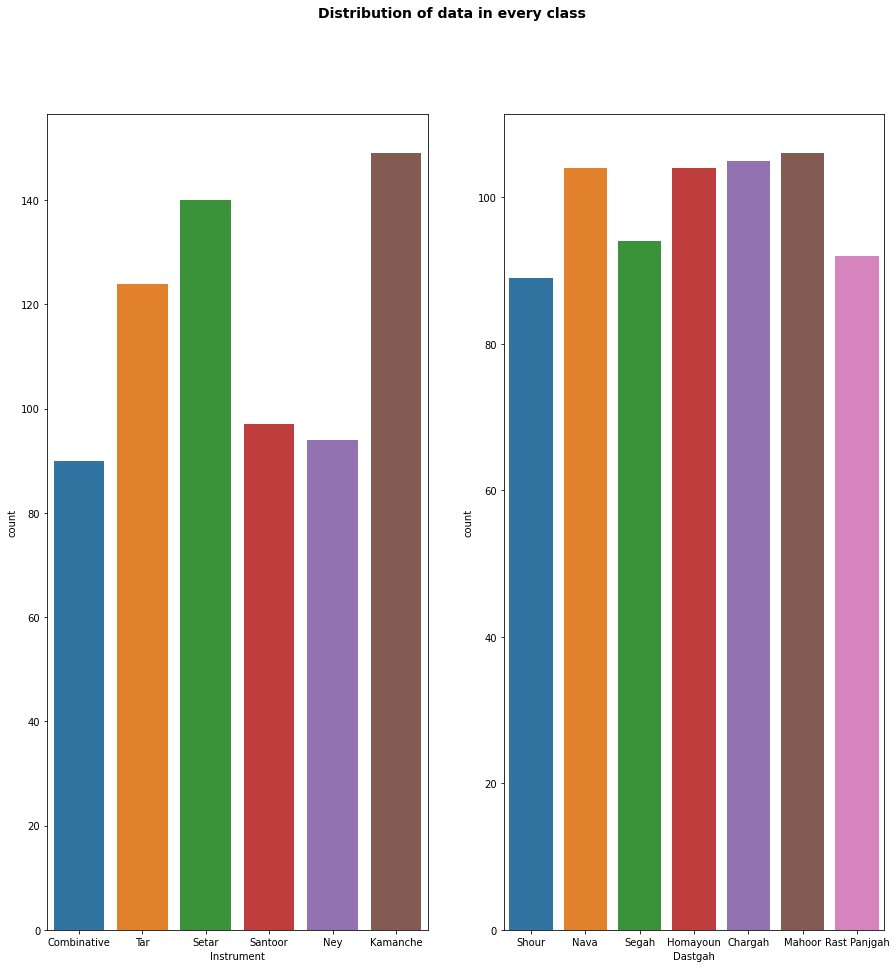

In [ ]:
#Same code as Above
fig, axs = plt.subplots(ncols=2,figsize=(15,15))
labels=['Instrument','Dastgah']
for i in range(2):
  sns.countplot(data=Dataset,x=ploting_df[labels[i]], ax=axs[i])
fig.suptitle('Distribution of data in every class', fontsize=14, fontweight='bold')

# **Normalzation**

In [39]:
# Normalizing data
x = Dataset.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
Normalized_Dataset = pd.DataFrame(x_scaled)

In [40]:
x = Dataset_spectrum.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
Normalized_Dataset_spectrum = pd.DataFrame(x_scaled)

In [59]:
!cp -r /content/drive/MyDrive/FinalDF /content

### Corrolation Matrix

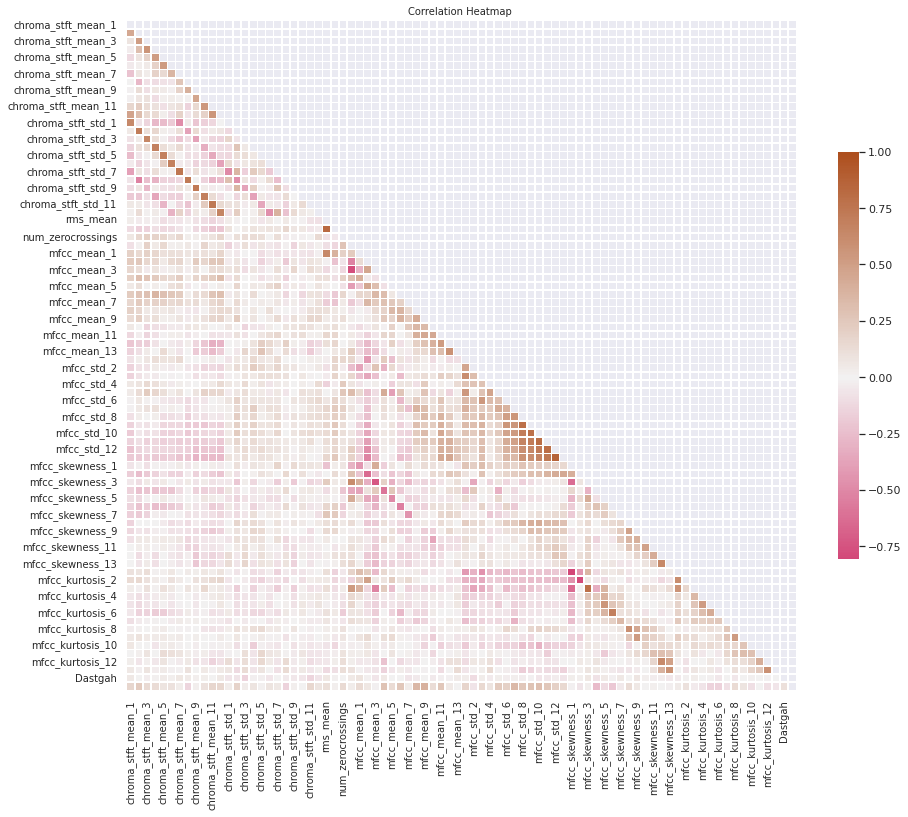

In [19]:
#correlation
corr = Dataset.corr()
#Creation of a mask for the heatmap
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
plt.subplots(figsize=(15,15))
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap ', fontsize =10)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);
plt.savefig("Corr_Heatmap.png")

#  PCA

Text(0, 0.5, 'cumulative explained variance')

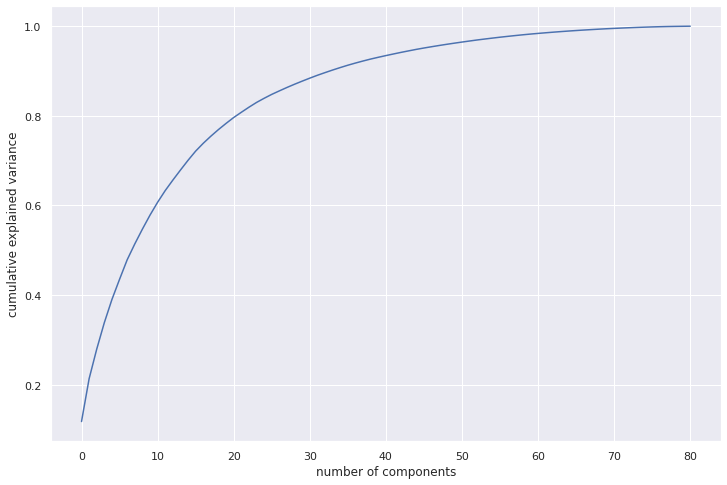

In [45]:
from sklearn.decomposition import PCA
sns.set()
pca = PCA().fit(Normalized_Dataset)
plt.subplots(figsize=(12, 8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

original shape:    (694, 81)
transformed shape: (694, 80)


Text(0, 0.5, 'Values')

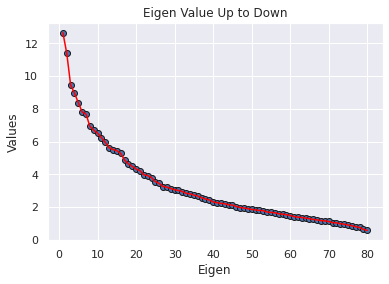

In [46]:
pca = PCA(n_components = 80)
pca.fit(Normalized_Dataset)
X_pca = pca.transform(Normalized_Dataset)
print("original shape:   ", Normalized_Dataset.shape)
print("transformed shape:", X_pca.shape)

plt.title("Eigen Value Up to Down")
plt.scatter(range(1,81),pca.singular_values_, edgecolors= "k")
plt.plot(range(1,81),pca.singular_values_ , color = 'red')
plt.xlabel('Eigen')
plt.ylabel('Values', rotation = 90)

In [55]:
pca = PCA(n_components = 70)
pca.fit(Normalized_Dataset)
X_pca = pca.transform(Normalized_Dataset)
main = pd.DataFrame(X_pca)
%cd  /content/drive/MyDrive/FinalDF
main.to_csv("PCA_dataset_80_70.csv")


/content/drive/.shortcut-targets-by-id/1-Xslsi0AUqQOPvW3ykqIBnydWtZJnFF0/FinalDF


Text(0, 0.5, 'cumulative explained variance')

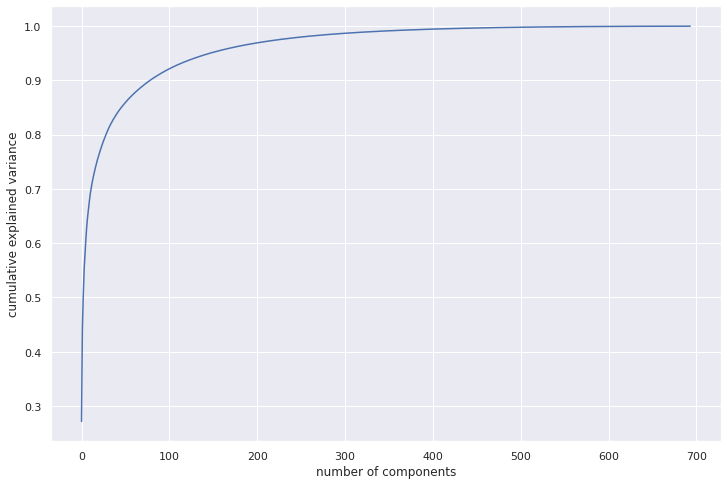

In [47]:
pca = PCA().fit(Normalized_Dataset_spectrum)
plt.subplots(figsize=(12, 8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

original shape:    (694, 3076)
transformed shape: (694, 600)


Text(0, 0.5, 'Values')

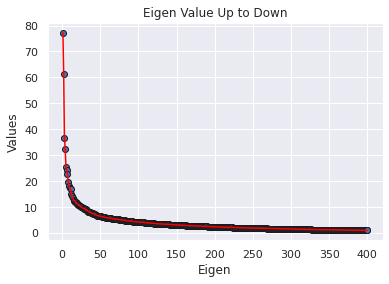

In [48]:
pca = PCA(n_components = 600)
pca.fit(Normalized_Dataset_spectrum)
X_pca = pca.transform(Normalized_Dataset_spectrum)
print("original shape:   ", Normalized_Dataset_spectrum.shape)
print("transformed shape:", X_pca.shape)

plt.title("Eigen Value Up to Down")
plt.scatter(range(1,401),pca.singular_values_[:400], edgecolors= "k")
plt.plot(range(1,401),pca.singular_values_[:400] , color = 'red')
plt.xlabel('Eigen')
plt.ylabel('Values', rotation = 90)

In [56]:
pca = PCA(n_components = 300)
pca.fit(Normalized_Dataset_spectrum)
X_pca = pca.transform(Normalized_Dataset_spectrum)
main = pd.DataFrame(X_pca)
main.to_csv("PCA_dataset_spectrum_3077_300.csv")

# LDA

In [58]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis(n_components=6)
X_r2 = lda.fit(Normalized_Dataset,Labels).transform(Normalized_Dataset)
print(X_r2.shape)
%cd  /content/drive/MyDrive/FinalDF
main = pd.DataFrame(X_r2)
main.to_csv("LDA_dataset.csv")


(694, 6)
/content/drive/.shortcut-targets-by-id/1-Xslsi0AUqQOPvW3ykqIBnydWtZJnFF0/FinalDF


Text(0, 0.5, 'cumulative explained variance')

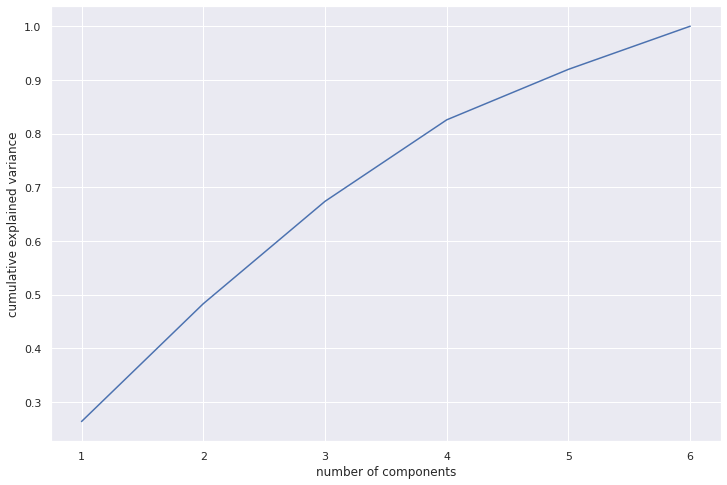

In [42]:
pca = LinearDiscriminantAnalysis().fit(Normalized_Dataset,Labels)
plt.subplots(figsize=(12, 8))
plt.plot(range(1,7),np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [57]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
lda = LinearDiscriminantAnalysis(n_components=6)
X_r2 = lda.fit(Normalized_Dataset_spectrum,Labels).transform(Normalized_Dataset_spectrum)
print(X_r2.shape)
%cd  /content/drive/MyDrive/FinalDF
main = pd.DataFrame(X_r2)
main.to_csv("LDA_dataset_spectrum.csv")

(694, 6)
/content/drive/.shortcut-targets-by-id/1-Xslsi0AUqQOPvW3ykqIBnydWtZJnFF0/FinalDF


Text(0, 0.5, 'cumulative explained variance')

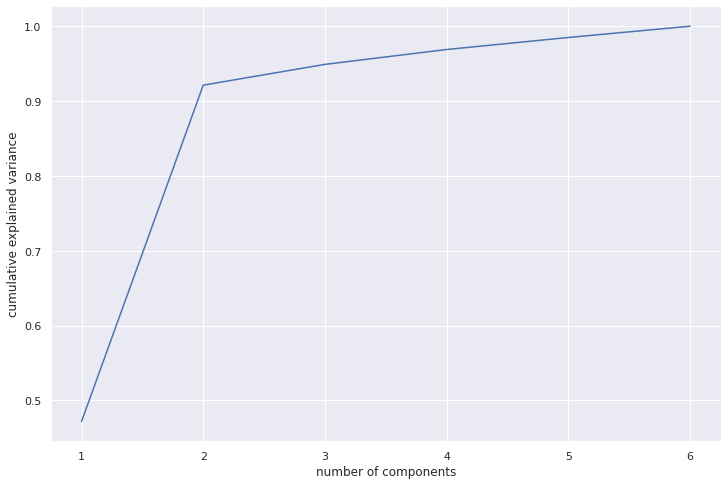

In [44]:
pca = LinearDiscriminantAnalysis().fit(Normalized_Dataset_spectrum,Labels)
plt.subplots(figsize=(12, 8))
plt.plot(range(1,7),np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')